<a href="https://colab.research.google.com/github/HwangHanJae/Dacon_tutorial/blob/main/hospital_predict_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

한국의 약 430개 병원의 재무제표 자료, 직원 수, 지역 정보가 제공됩니다. Inst_iid를 기준으로 샘플링 하였으며 어떤 병원이 폐업하는 지를 예측해야 합니다. 폐업은 0, 잔존은 1로 예측하면 됩니다.

 

제출한 예측 결과물은 정확도(accuracy)로 평가합니다(평가는 게시된 데이터셋만을 기준으로 합니다). 정확도가 높은 참가자가 높은 순위가 되며 동점자는 제출 순으로 순위를 정합니다. 상금 수령 시 코드 검증 및 코드에 주석(한글, 영문)으로 설명을 해야 합니다. Dataset Search - Google 등과 같은 MOUDA에서 사용함에 있어서 법적인 제약이 없는 외부 데이터(공공 데이터) 사용 가능합니다. 

컬럼 소개(1 : 2017년 자료 , 2 : 2016년 자료)

inst_id : 각 파일에서의 병원 고유 번호

sido : 병원의 광역 지역 정보

sgg : 병원의 시군구 자료

openDate : 병원설립일

bedCount : 병원이 갖추고 있는 병상의 수

instkind : 병원, 의원, 요양병원, 한의원, 종합병원 등 병원의 종류 종합병원 : 입원환자 100명 이상 수용 가능 병원 : 입원 환자 30명 이상 100명 미만 수용 가능 의원 : 입원 환자 30명 이하 수용 가능 한방 병원(한의원) : 침술과 한약으로 치료하는 의료 기관.

revenue1 : 매출액, 2017(회계년도)년 데이터를 의미함

salescost1 : 매출원가, 2017(회계년도)년 데이터를 의미함

sga1: 판매비와 관리비, 2017(회계년도)년 데이터를 의미함

salary1 : 급여, 2017(회계년도)년 데이터를 의미함

noi1 : 영업외수익, 2017(회계년도)년 데이터를 의미함

noe1 : 영업외비용, 2017(회계년도)년 데이터를 의미함

Interest1 : 이자비용, 2017(회계년도)년 데이터를 의미함

ctax1 : 법인세비용, 2017(회계년도)년 데이터를 의미함

Profit1 : 당기순이익, 2017(회계년도)년 데이터를 의미함

liquidAsset1 : 유동자산, 2017(회계년도)년 데이터를 의미함

quickAsset1 : 당좌자산, 2017(회계년도)년 데이터를 의미함

receivableS1 : 미수금(단기), 2017(회계년도)년 데이터를 의미함

inventoryAsset1 : 재고자산, 2017(회계년도)년 데이터를 의미함

nonCAsset1 : 비유동자산, 2017(회계년도)년 데이터를 의미함

tanAsset1 : 유형자산, 2017(회계년도)년 데이터를 의미함

OnonCAsset1 : 기타 비유동자산, 2017(회계년도)년 데이터를 의미함

receivableL1 : 장기미수금, 2017(회계년도)년 데이터를 의미함

debt1 : 부채총계, 2017(회계년도)년 데이터를 의미함

liquidLiabilities1 : 유동부채, 2017(회계년도)년 데이터를 의미함

shortLoan1 : 단기차입금, 2017(회계년도)년 데이터를 의미함

NCLiabilities1 : 비유동부채, 2017(회계년도)년 데이터를 의미함

longLoan1 : 장기차입금, 2017(회계년도)년 데이터를 의미함

surplus1 : 이익잉여금, 2017(회계년도)년 데이터를 의미함

employee1 : 고용한 총 직원의 수, 2017(회계년도)년 데이터를 의미함

ownerChange : 대표자의 변동 여부

In [3]:
#라이브러리 로드
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from IPython.display import set_matplotlib_formats
import seaborn as sns
plt.style.use("seaborn")
set_matplotlib_formats("svg")

In [4]:
#데이터로드
submission = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataScience/Data/hospital_data/submission_sample.csv")
train = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataScience/Data/hospital_data/train.csv")
test = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataScience/Data/hospital_data/test.csv")

train.shape, test.shape, submission.shape

((301, 58), (127, 58), (127, 2))

In [5]:
train.head()

,inst_id,OC,sido,sgg,openDate,bedCount,instkind,revenue1,salescost1,sga1,salary1,noi1,noe1,interest1,ctax1,profit1,liquidAsset1,quickAsset1,receivableS1,inventoryAsset1,nonCAsset1,tanAsset1,OnonCAsset1,receivableL1,debt1,liquidLiabilities1,shortLoan1,NCLiabilities1,longLoan1,netAsset1,surplus1,revenue2,salescost2,sga2,salary2,noi2,noe2,interest2,ctax2,profit2,liquidAsset2,quickAsset2,receivableS2,inventoryAsset2,nonCAsset2,tanAsset2,OnonCAsset2,receivableL2,debt2,liquidLiabilities2,shortLoan2,NCLiabilities2,longLoan2,netAsset2,surplus2,employee1,employee2,ownerChange
0,1,open,choongnam,73,20071228,175.0,nursing_hospital,4.217530e+09,0.0,3.961135e+09,2.033835e+09,15652441.0,1.523624e+07,1.323624e+07,31641798.0,225169678.0,1.012700e+09,9.976719e+08,4.700557e+08,1.502781e+07,2.514586e+09,2.360684e+09,1.434496e+08,0.0,6.828260e+08,2.013237e+08,0.000000e+00,4.815023e+08,3.510000e+08,2.844460e+09,1.496394e+09,4.297848e+09,0.0,4.057422e+09,2.063787e+09,16194675.0,2.998335e+07,1.568305e+07,18808074.0,207829685.0,8.301695e+08,8.165705e+08,5.237026e+08,1.359897e+07,2.548115e+09,2.386263e+09,1.458986e+08,0.0,7.589937e+08,2.228769e+08,0.000000e+00,5.361169e+08,3.900000e+08,2.619290e+09,1.271224e+09,62.0,64.0,same
1,3,open,gyeongnam,32,19970401,410.0,general_hospital,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,801.0,813.0,same
2,4,open,gyeonggi,89,20161228,468.0,nursing_hospital,1.004522e+09,515483669.0,4.472197e+08,2.964023e+08,76156.0,3.000000e+04,0.000000e+00,0.0,41864754.0,2.724421e+08,2.536822e+08,8.095950e+06,1.875997e+07,1.204810e+08,1.204810e+08,0.000000e+00,0.0,9.241434e+07,9.241434e+07,0.000000e+00,0.000000e+00,0.000000e+00,3.005088e+08,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,234.0,1.0,same
3,7,open,incheon,141,20000814,353.0,general_hospital,7.250734e+10,0.0,7.067740e+10,3.178605e+10,506223059.0,1.259568e+09,1.196881e+09,173769780.0,902830288.0,1.304154e+10,1.153475e+10,0.000000e+00,1.506793e+09,4.317936e+10,3.832078e+10,3.945208e+09,0.0,4.236380e+10,2.799188e+10,1.988520e+10,1.437192e+10,7.253040e+09,1.385710e+10,8.643659e+09,6.685834e+10,0.0,6.492419e+10,2.971135e+10,476807804.0,1.353672e+09,1.277422e+09,218891720.0,838387466.0,1.112572e+10,9.890540e+09,0.000000e+00,1.235181e+09,3.958356e+10,3.485576e+10,3.915906e+09,0.0,3.775501e+10,1.701860e+10,9.219427e+09,2.073641e+10,1.510000e+10,1.295427e+10,7.740829e+09,663.0,663.0,same
4,9,open,gyeongnam,32,20050901,196.0,general_hospital,4.904354e+10,0.0,4.765605e+10,2.446078e+10,112352259.0,1.419089e+09,1.307249e+09,0.0,80749696.0,6.317084e+09,5.873265e+09,4.099320e+09,4.438186e+08,4.366733e+10,4.330613e+10,2.223400e+08,0.0,4.989811e+10,2.890919e+10,1.793038e+10,2.098892e+10,1.350000e+10,8.631164e+07,9.025550e+09,4.808280e+10,0.0,4.712580e+10,2.346004e+10,597748128.0,1.522108e+09,1.349851e+09,0.0,32642585.0,4.906776e+09,4.464017e+09,3.365227e+09,4.427591e+08,4.653138e+10,4.562945e+10,7.893407e+08,0.0,5.143259e+10,3.007259e+10,1.759375e+10,2.136001e+10,1.410803e+10,5.561941e+06,9.025550e+09,206.0,197.0,same


In [6]:
#null 값 확인
train.isnull().sum()

inst_id                0
OC                     0
sido                   0
sgg                    0
openDate               0
bedCount               5
instkind               1
revenue1               8
salescost1             8
sga1                   8
salary1                8
noi1                   8
noe1                   8
interest1              8
ctax1                  8
profit1                8
liquidAsset1           8
quickAsset1            8
receivableS1           8
inventoryAsset1        8
nonCAsset1             8
tanAsset1              8
OnonCAsset1            8
receivableL1           8
debt1                  8
liquidLiabilities1     8
shortLoan1             8
NCLiabilities1         8
longLoan1              8
netAsset1              8
surplus1               8
revenue2               8
salescost2             8
sga2                   8
salary2                8
noi2                   8
noe2                   8
interest2              8
ctax2                  8
profit2                8


In [7]:
test.isnull().sum()

inst_id                 0
OC                    127
sido                    0
sgg                     0
openDate                1
bedCount                8
instkind                2
revenue1                2
salescost1              2
sga1                    2
salary1                 2
noi1                    2
noe1                    2
interest1               2
ctax1                   2
profit1                 2
liquidAsset1            2
quickAsset1             2
receivableS1            2
inventoryAsset1         2
nonCAsset1              2
tanAsset1               2
OnonCAsset1             2
receivableL1            2
debt1                   2
liquidLiabilities1      2
shortLoan1              2
NCLiabilities1          2
longLoan1               2
netAsset1               2
surplus1                2
revenue2                2
salescost2              2
sga2                    2
salary2                 2
noi2                    2
noe2                    2
interest2               2
ctax2       

##EDA

###[다중공선성](https://terms.naver.com/entry.naver?docId=3404410&cid=40942&categoryId=32211)

In [ ]:
train.loc[train["OC"] == "open", "OC"] = 1
train.loc[train["OC"] == " close","OC"] = 0

test.loc[test["OC"] == "open", "OC"] = 1
test.loc[test["OC"] == " close","OC"] = 0

train["OC"] = train["OC"].astype(dtype=np.int64)

0      1
1      1
2      1
3      1
4      1
      ..
296    1
297    0
298    0
299    0
300    1
Name: OC, Length: 301, dtype: int64

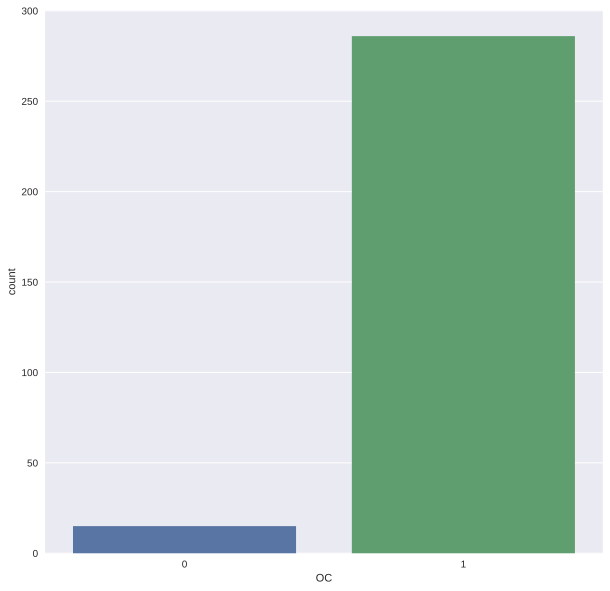

In [ ]:
#OC(개/폐업) 수 확인

plt.figure(figsize=(10,10))
sns.countplot(data=train, x='OC')

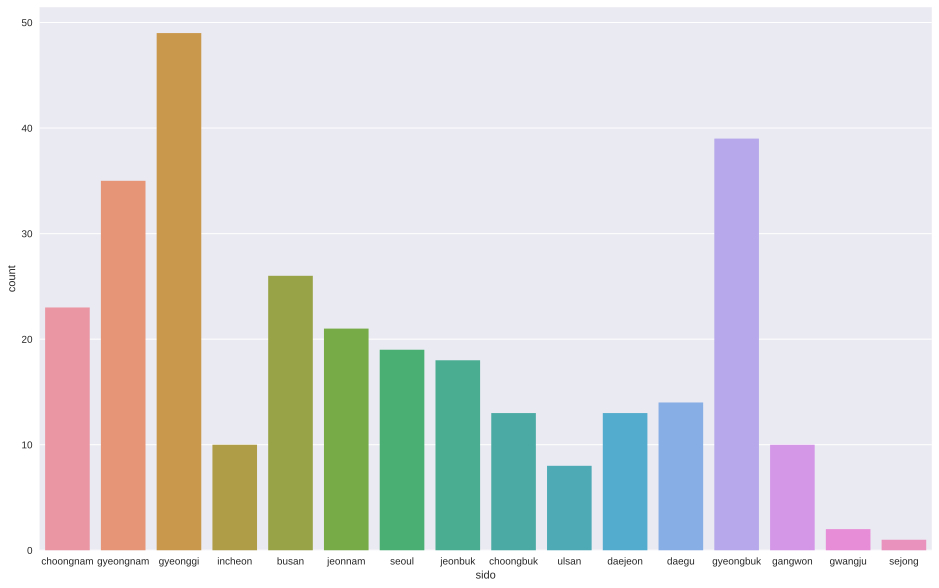

In [ ]:
#sido의 분포
plt.figure(figsize=(16,10))
sns.countplot(data=train, x='sido')

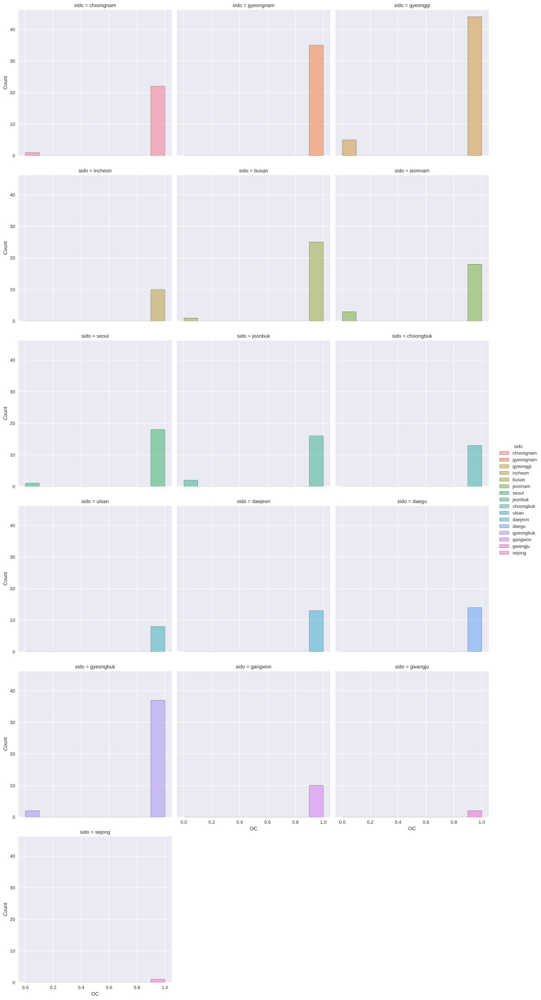

In [ ]:
#sido별 OC 확인

sns.displot(data=train, x='OC', hue='sido',col='sido',col_wrap=3)

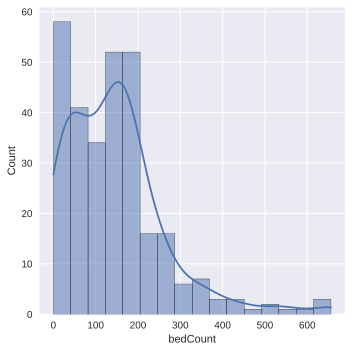

In [ ]:
#bedCount
sns.displot(data=train, x='bedCount', kde=True)

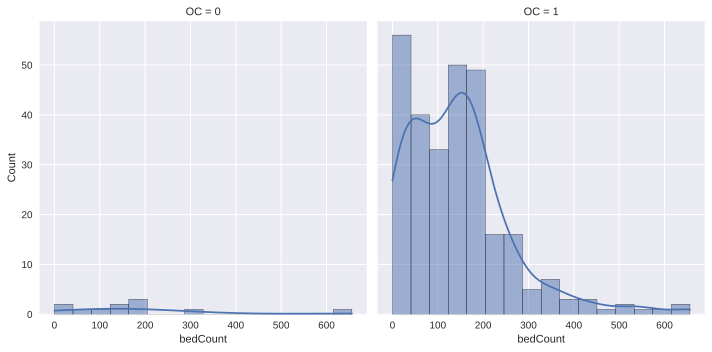

In [ ]:
#bedcount
sns.displot(data=train, x='bedCount', kde=True,col='OC')

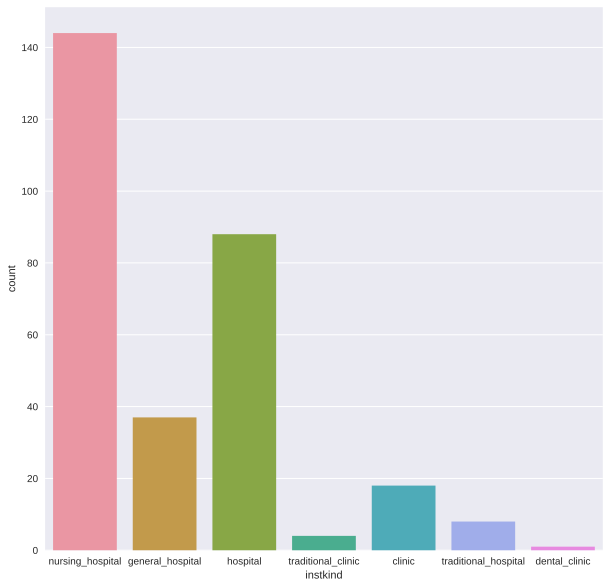

In [ ]:
#instkind(병원의 종류)
plt.figure(figsize=(10,10))
sns.countplot(data=train, x='instkind')

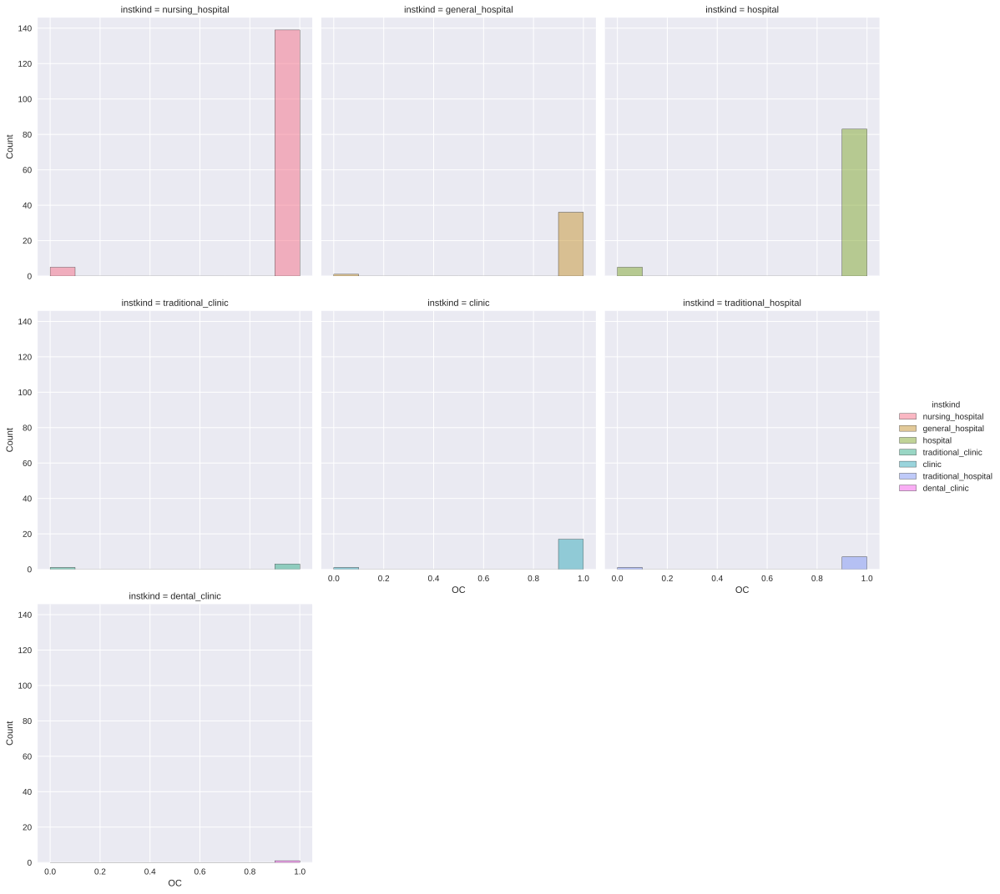

In [ ]:
sns.displot(data=train, x='OC', hue='instkind',col='instkind',col_wrap=3)

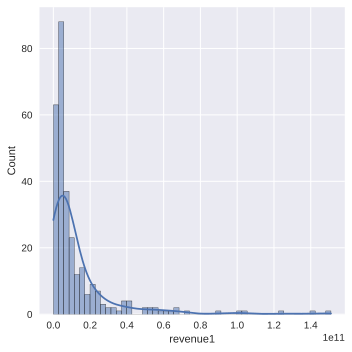

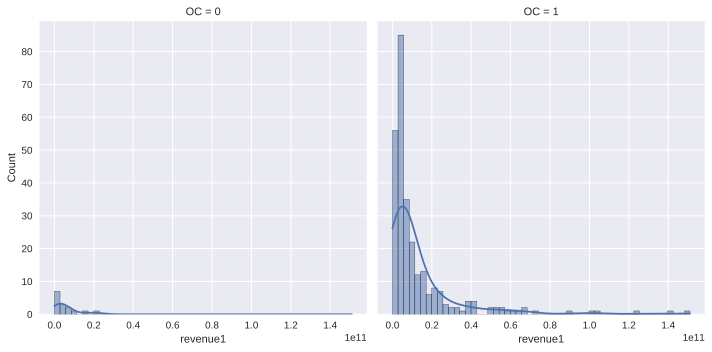

In [ ]:
#2017 매출액
sns.displot(data=train, x='revenue1', kde=True)
sns.displot(data=train, x='revenue1', kde=True,col='OC')

In [ ]:
#sns.scatterplot(data=train, x='revenue1', y='OC')

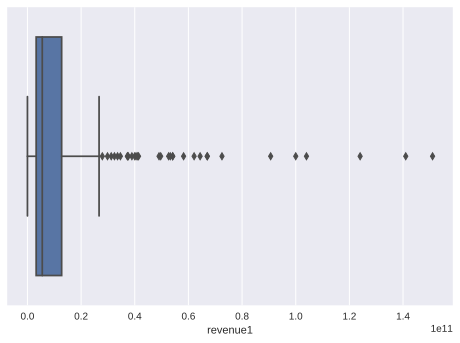

In [ ]:
sns.boxplot(data=train, x='revenue1')

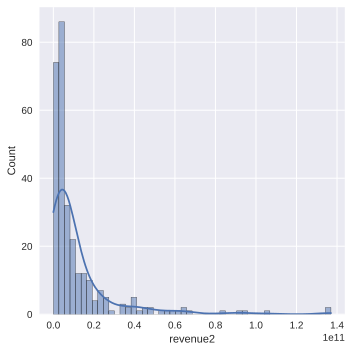

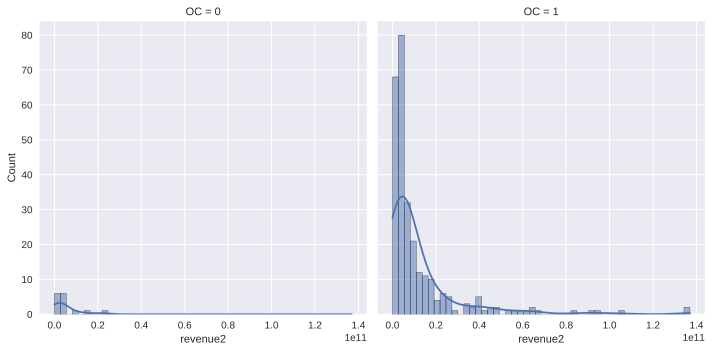

In [ ]:
#2016 매출액
sns.displot(data=train, x='revenue2', kde=True)
sns.displot(data=train, x='revenue2', kde=True,col='OC')

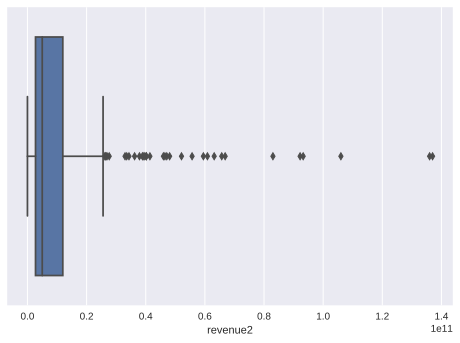

In [ ]:
sns.boxplot(data=train, x='revenue2')

In [ ]:
train[["revenue1","revenue2"]].corr()

,revenue1,revenue2
revenue1,1.000000,0.987402
revenue2,0.987402,1.000000


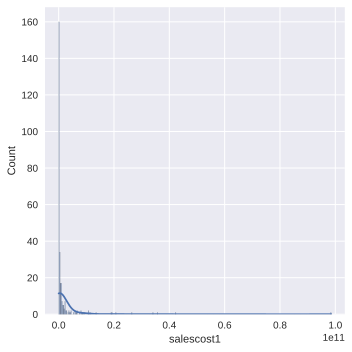

In [ ]:
"#2017 매출원가

sns.displot(data=train, x='salescost1', kde=True)

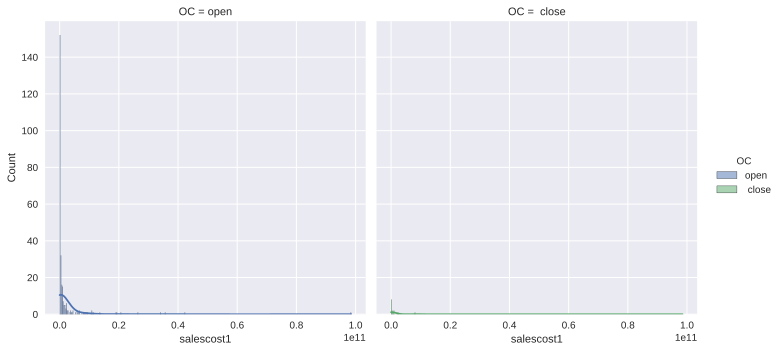

In [ ]:
sns.displot(data=train, x='salescost1', kde=True, hue='OC',col='OC')

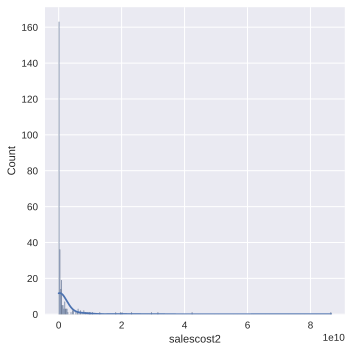

In [ ]:
#2016년도 매출원가

sns.displot(data=train, x='salescost2', kde=True)

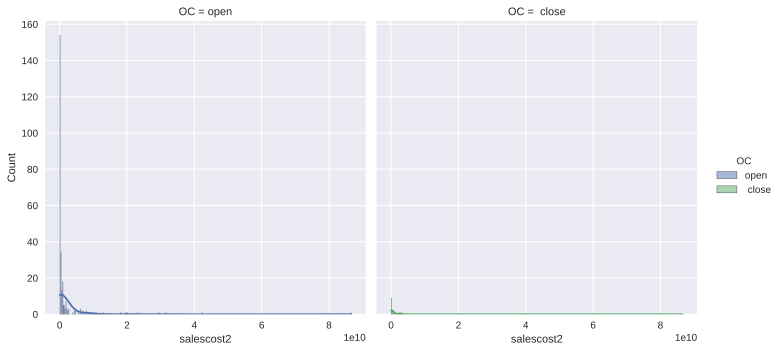

In [ ]:
sns.displot(data=train, x='salescost2', kde=True,  hue='OC',col='OC')

In [ ]:
train[["salescost1","salescost2"]].corr()

,salescost1,salescost2
salescost1,1.000000,0.994907
salescost2,0.994907,1.000000


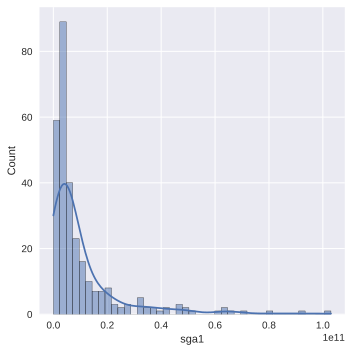

In [ ]:
#판매비와 관리비 2017년
sns.displot(data=train, x='sga1',kde=True)

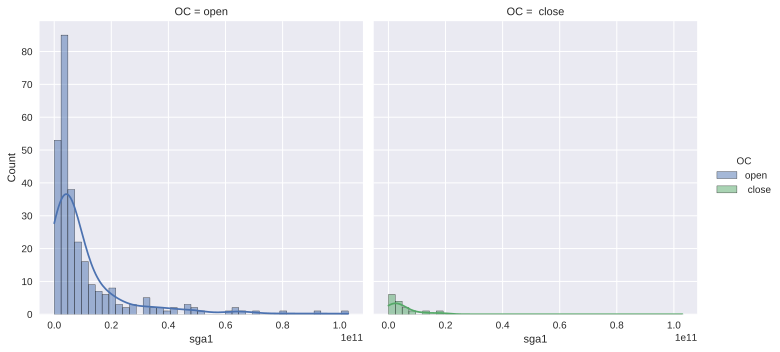

In [ ]:
sns.displot(data=train, x='sga1',kde=True,hue='OC', col="OC")

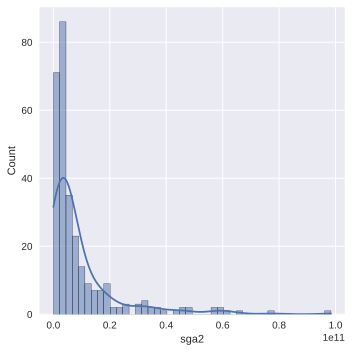

In [ ]:
#판매비와 관리비 2016년

sns.displot(data=train, x='sga2', kde=True)

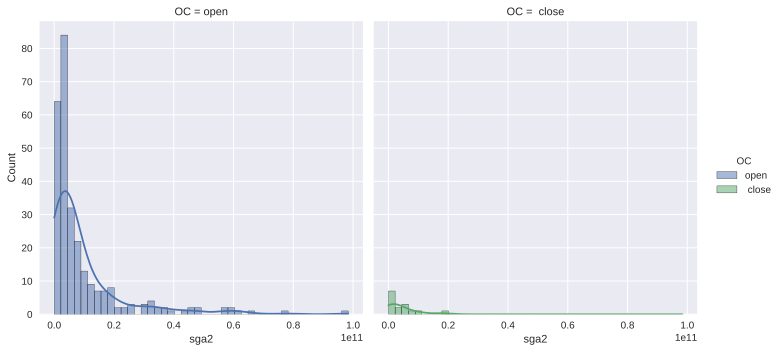

In [ ]:
sns.displot(data=train, x='sga2', kde=True, hue='OC', col='OC')

In [ ]:
train[["sga1","sga2"]].corr()

,sga1,sga2
sga1,1.000000,0.977083
sga2,0.977083,1.000000


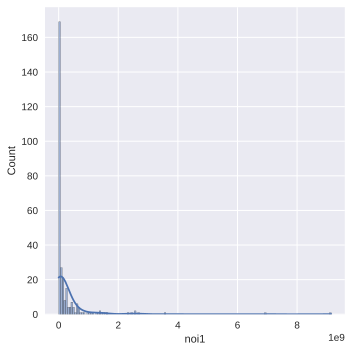

In [ ]:
#2017년 영업외 수익

sns.displot(data=train, x='noi1', kde=True)

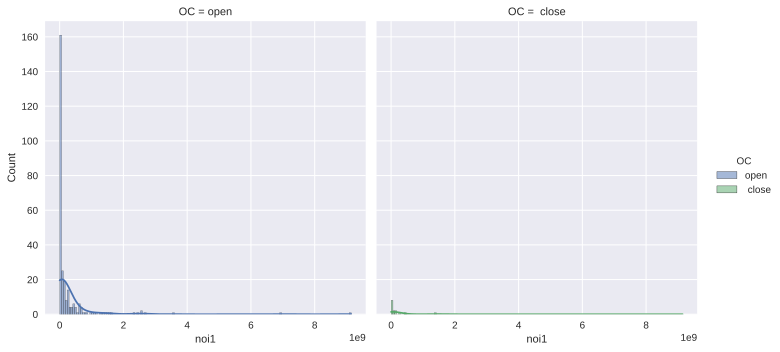

In [ ]:
sns.displot(data=train, x='noi1', kde=True, hue='OC', col='OC')

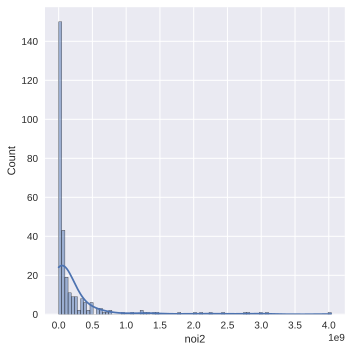

In [ ]:
#2016년 영업외 수익

sns.displot(data=train, x='noi2', kde=True)

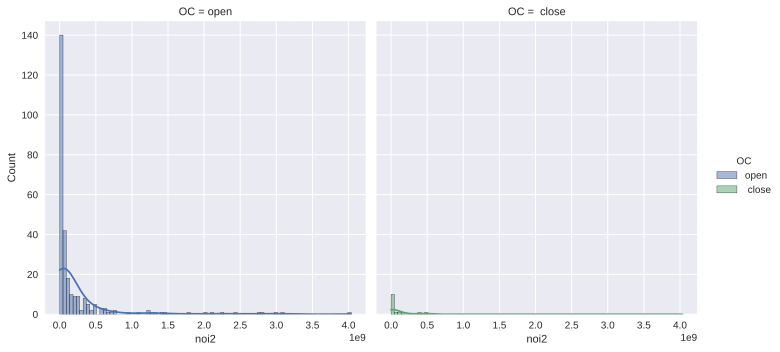

In [ ]:
sns.displot(data=train, x='noi2', kde=True, hue='OC', col='OC')

In [ ]:
train[["noi1","noi2"]].corr()

,noi1,noi2
noi1,1.000000,0.667931
noi2,0.667931,1.000000


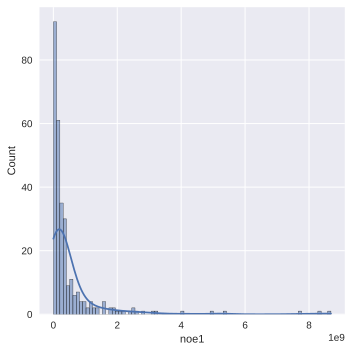

In [ ]:
#2017년 영업외비용

sns.displot(data=train, x='noe1', kde=True)

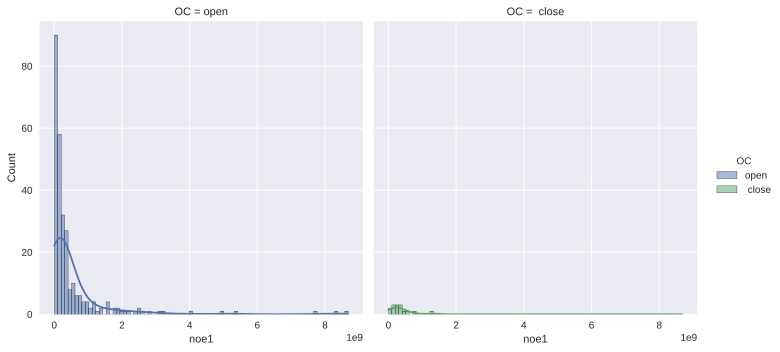

In [ ]:
sns.displot(data=train, x='noe1', kde=True, hue='OC', col='OC')

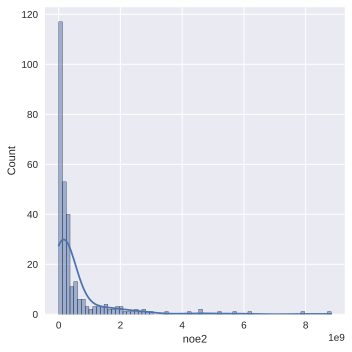

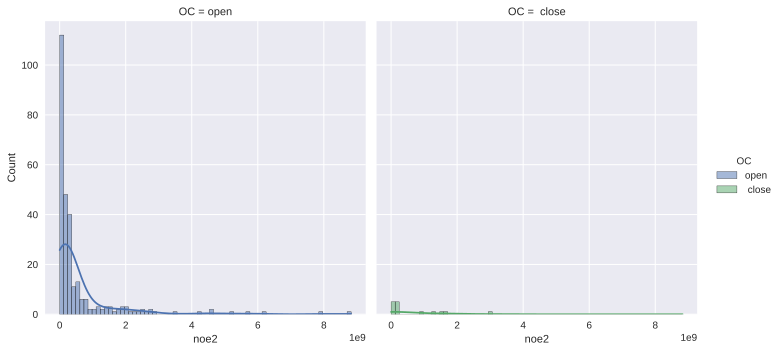

In [ ]:
#2016년 영업외비용

sns.displot(data=train, x='noe2', kde=True)
sns.displot(data=train, x='noe2', kde=True, hue='OC', col='OC')

In [ ]:
train[["noe1","noe2"]].corr()

,noe1,noe2
noe1,1.000000,0.753554
noe2,0.753554,1.000000


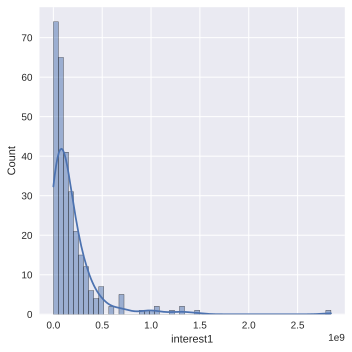

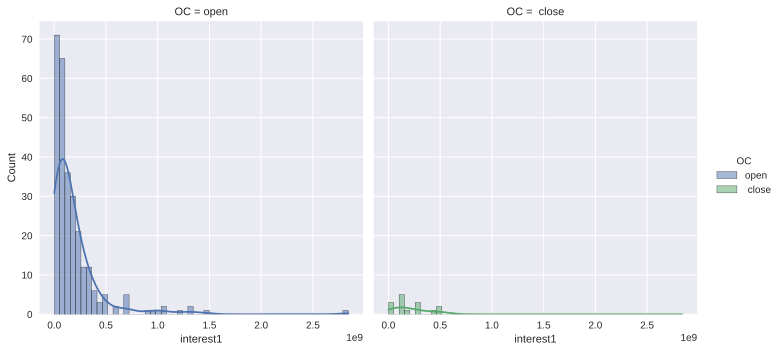

In [ ]:
#2017년 이자비용
sns.displot(data=train, x='interest1', kde=True)
sns.displot(data=train, x='interest1', kde=True, hue='OC', col='OC')

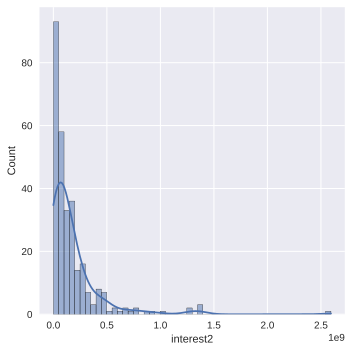

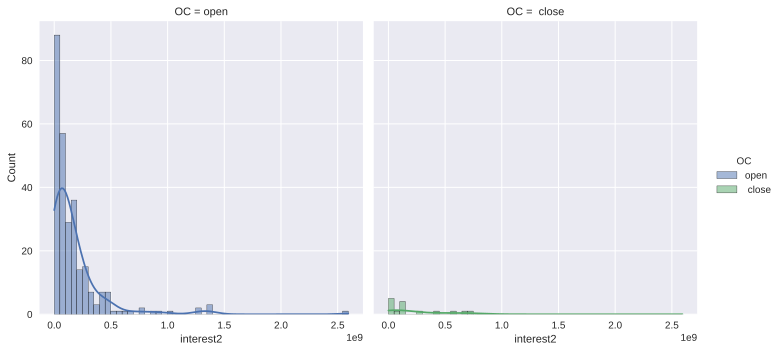

In [ ]:
#2016년 이자비용
sns.displot(data=train, x='interest2', kde=True)
sns.displot(data=train, x='interest2', kde=True, hue='OC', col='OC')

In [ ]:
train[["interest1","interest2"]].corr()

,interest1,interest2
interest1,1.000000,0.954603
interest2,0.954603,1.000000


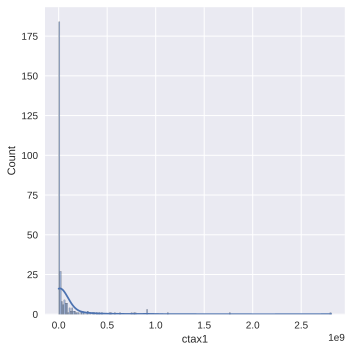

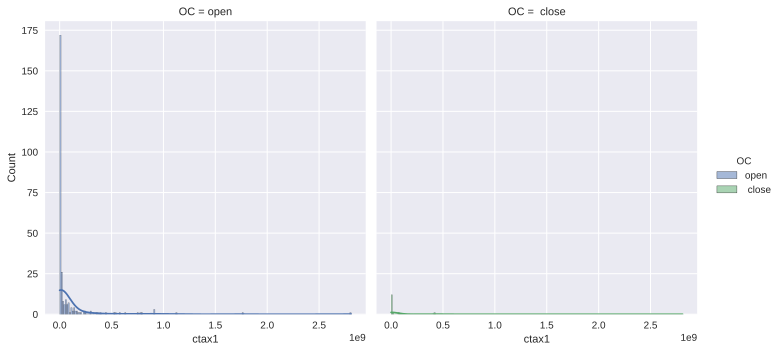

In [ ]:
#2017년 법인세비용

sns.displot(data=train, x='ctax1', kde=True)
sns.displot(data=train, x='ctax1', kde=True, hue='OC', col='OC')

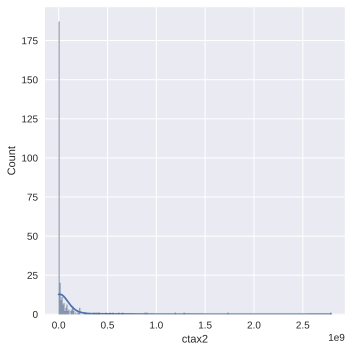

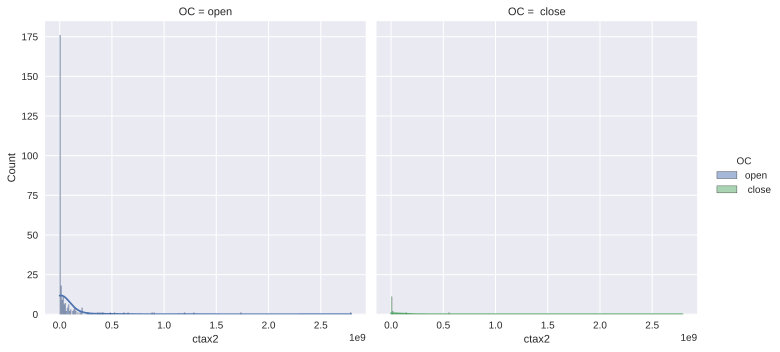

In [ ]:
#2017년 법인세비용

sns.displot(data=train, x='ctax2', kde=True)
sns.displot(data=train, x='ctax2', kde=True, hue='OC', col='OC')

In [ ]:
train[["ctax1","ctax2"]].corr()

,ctax1,ctax2
ctax1,1.000000,0.879134
ctax2,0.879134,1.000000


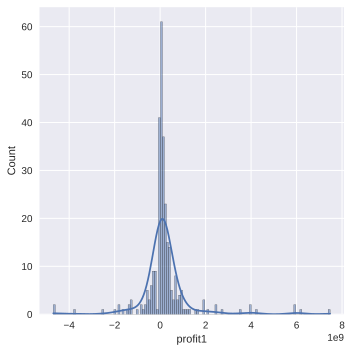

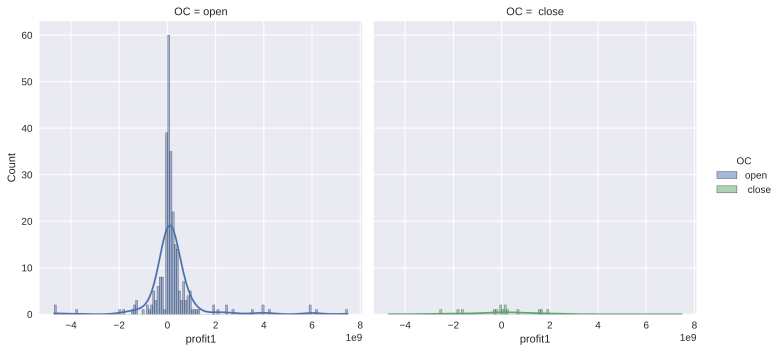

In [ ]:
#2017년 당기순이익
sns.displot(data=train, x='profit1', kde=True)
sns.displot(data=train, x='profit1', kde=True, hue='OC', col='OC')


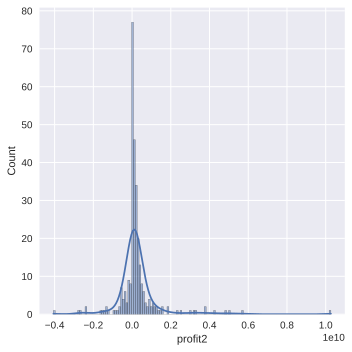

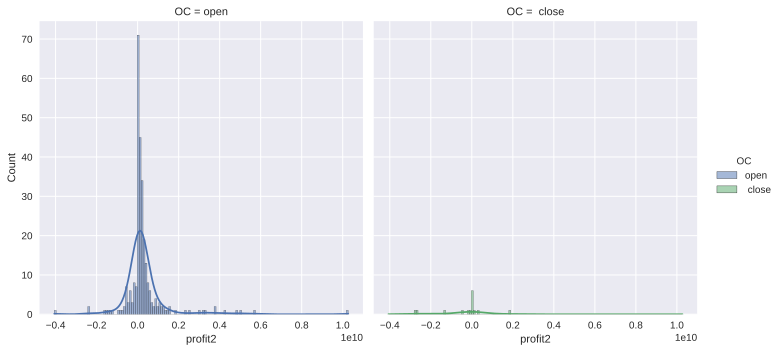

In [ ]:
#2016년 당기순이익
sns.displot(data=train, x='profit2', kde=True)
sns.displot(data=train, x='profit2', kde=True, hue='OC', col='OC')


In [ ]:
train[["profit1","profit2"]].corr()

,profit1,profit2
profit1,1.000000,0.688576
profit2,0.688576,1.000000


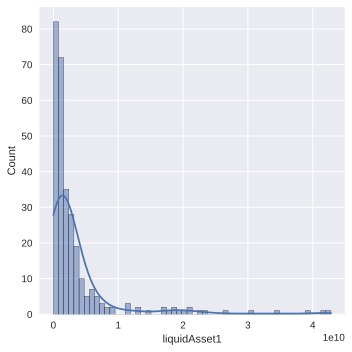

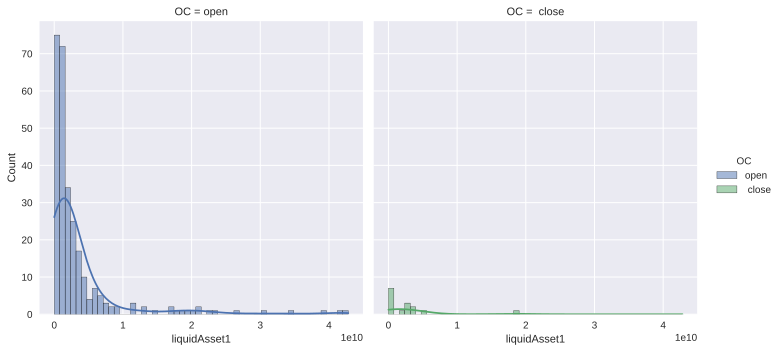

In [ ]:
#2017년 유동자산

sns.displot(data=train, x='liquidAsset1', kde=True)
sns.displot(data=train, x='liquidAsset1', kde=True, hue='OC', col='OC')

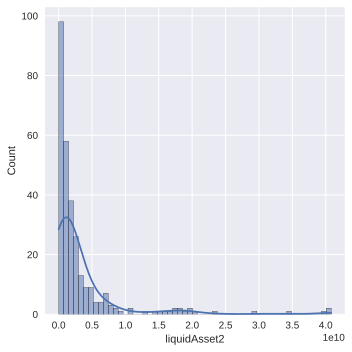

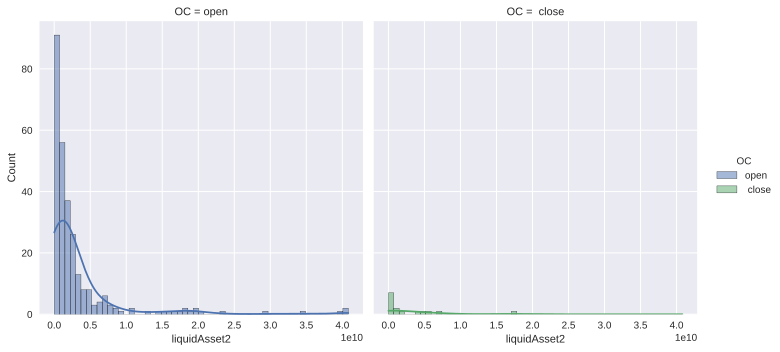

In [ ]:
#2016년 유동자산

sns.displot(data=train, x='liquidAsset2', kde=True)
sns.displot(data=train, x='liquidAsset2', kde=True, hue='OC', col='OC')

In [ ]:
train[["liquidAsset1","liquidAsset2"]].corr()

,liquidAsset1,liquidAsset2
liquidAsset1,1.000000,0.971201
liquidAsset2,0.971201,1.000000


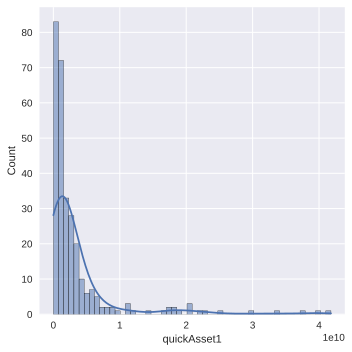

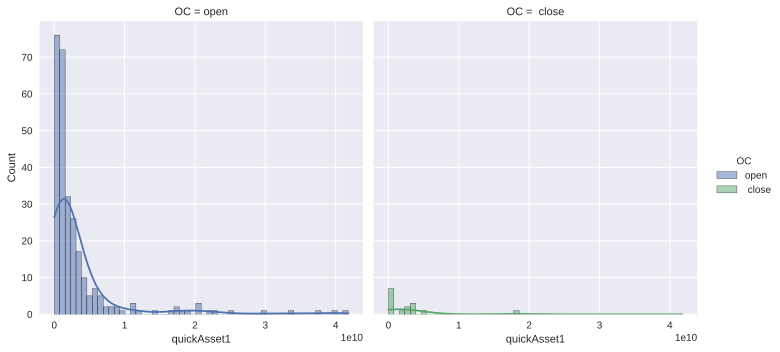

In [ ]:
#2017년 당좌자산
sns.displot(data=train, x='quickAsset1', kde=True)
sns.displot(data=train, x='quickAsset1', kde=True, hue='OC', col='OC')

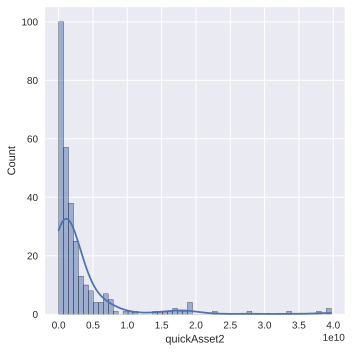

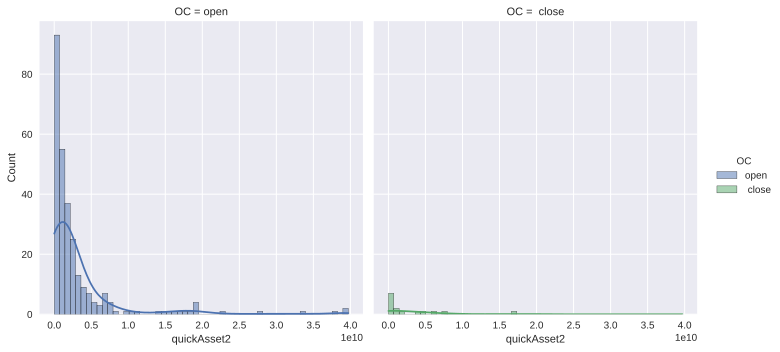

In [ ]:
#2016년 당좌자산
sns.displot(data=train, x='quickAsset2', kde=True)
sns.displot(data=train, x='quickAsset2', kde=True, hue='OC', col='OC')

In [ ]:
train[["quickAsset1","quickAsset2"]].corr()

,quickAsset1,quickAsset2
quickAsset1,1.000000,0.969801
quickAsset2,0.969801,1.000000


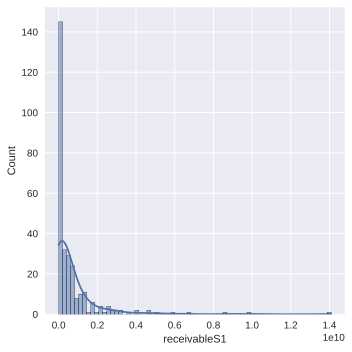

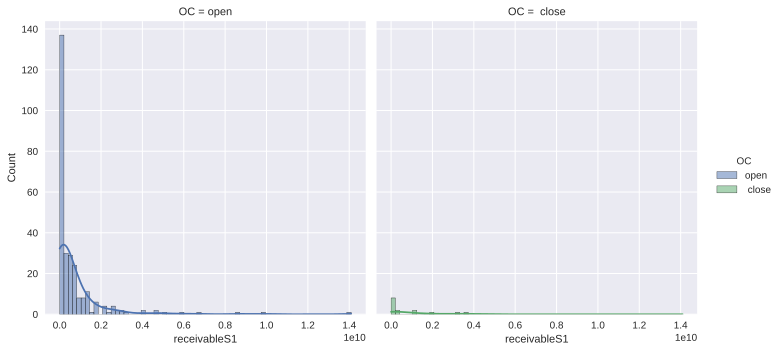

In [ ]:
#2017 미수금(단기)
sns.displot(data=train, x='receivableS1', kde=True)
sns.displot(data=train, x='receivableS1', kde=True, hue='OC', col='OC')


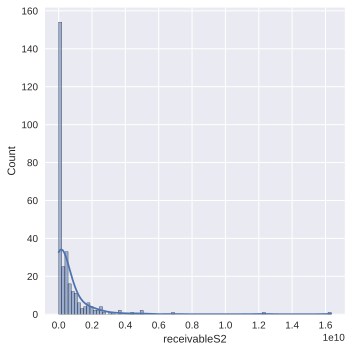

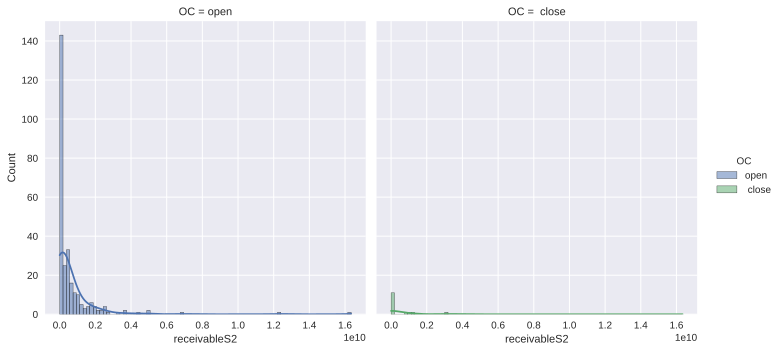

In [ ]:
#2016 미수금(단기)
sns.displot(data=train, x='receivableS2', kde=True)
sns.displot(data=train, x='receivableS2', kde=True, hue='OC', col='OC')

In [ ]:
train[["receivableS1","receivableS2"]].corr()

,receivableS1,receivableS2
receivableS1,1.000000,0.697082
receivableS2,0.697082,1.000000


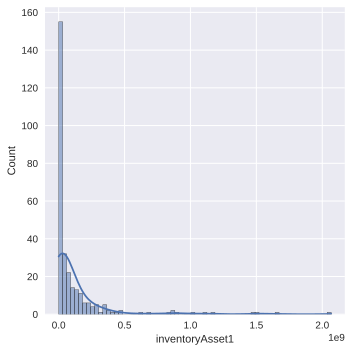

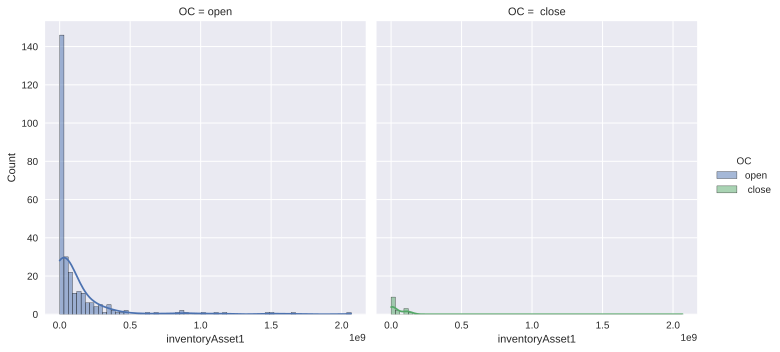

In [ ]:
#2017년 재고자산
sns.displot(data=train, x='inventoryAsset1', kde=True)
sns.displot(data=train, x='inventoryAsset1', kde=True, hue='OC', col='OC')


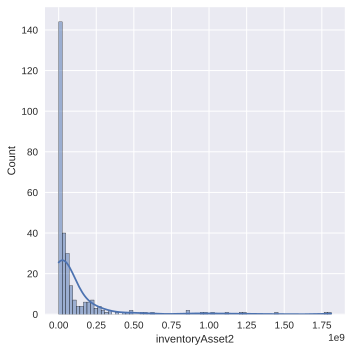

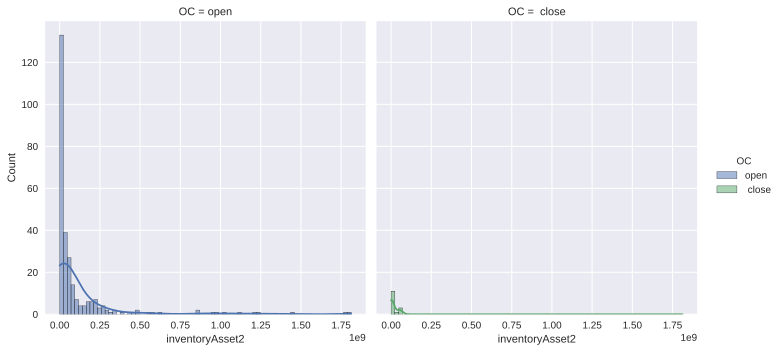

In [ ]:
#2016년 재고자산
sns.displot(data=train, x='inventoryAsset2', kde=True)
sns.displot(data=train, x='inventoryAsset2', kde=True, hue='OC', col='OC')

In [ ]:
train[["inventoryAsset1","inventoryAsset2"]].corr()

,inventoryAsset1,inventoryAsset2
inventoryAsset1,1.000000,0.974494
inventoryAsset2,0.974494,1.000000


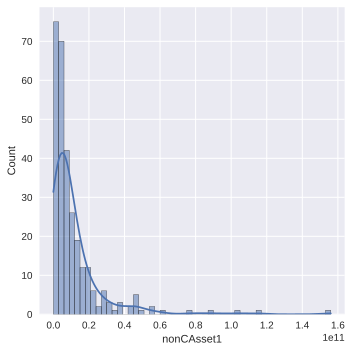

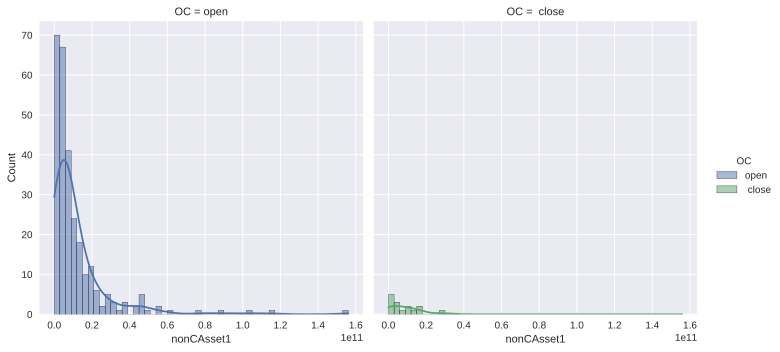

In [ ]:
#2017년 비유동자산
sns.displot(data=train, x='nonCAsset1', kde=True)
sns.displot(data=train, x='nonCAsset1', kde=True, hue='OC', col='OC')



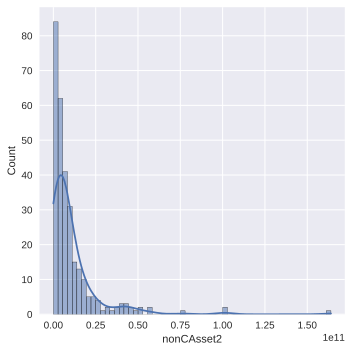

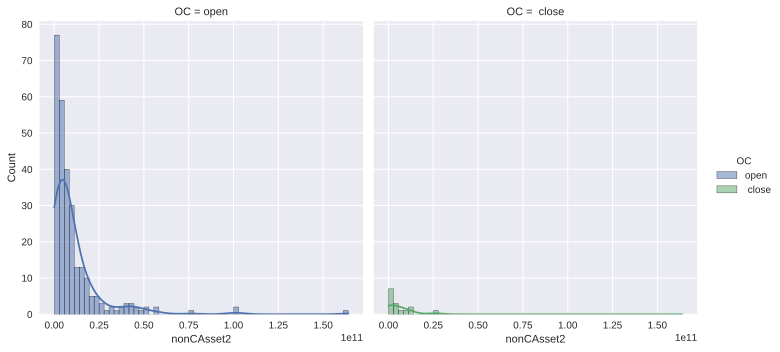

In [ ]:
#2016년 비유동자산
sns.displot(data=train, x='nonCAsset2', kde=True)
sns.displot(data=train, x='nonCAsset2', kde=True, hue='OC', col='OC')


In [ ]:
train[["nonCAsset1","nonCAsset2"]].corr()

,nonCAsset1,nonCAsset2
nonCAsset1,1.000000,0.972527
nonCAsset2,0.972527,1.000000


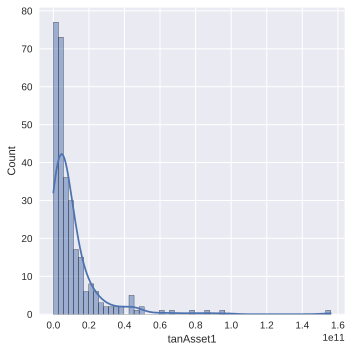

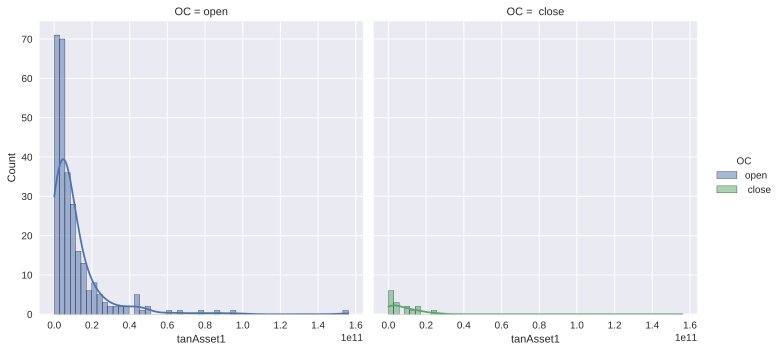

In [ ]:
#2017년 유형자산
sns.displot(data=train, x='tanAsset1', kde=True)
sns.displot(data=train, x='tanAsset1', kde=True, hue='OC', col='OC')


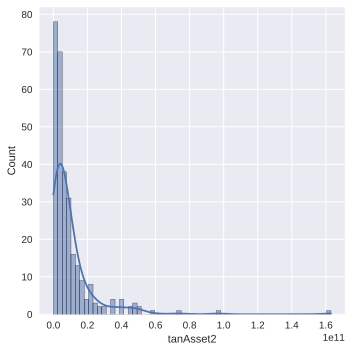

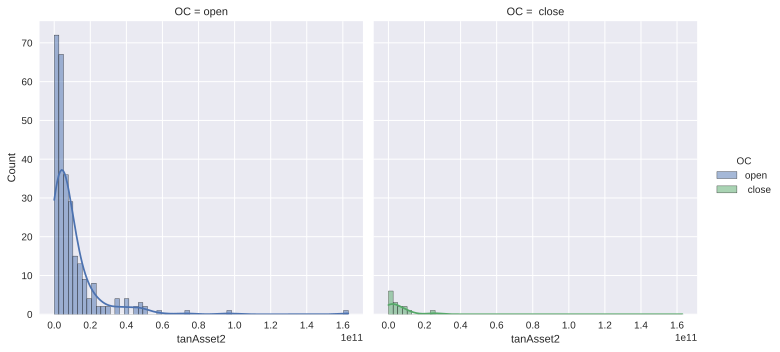

In [ ]:
#2016년 유형자산
sns.displot(data=train, x='tanAsset2', kde=True)
sns.displot(data=train, x='tanAsset2', kde=True, hue='OC', col='OC')


In [ ]:
train[["tanAsset1","tanAsset2"]].corr()

,tanAsset1,tanAsset2
tanAsset1,1.000000,0.968505
tanAsset2,0.968505,1.000000


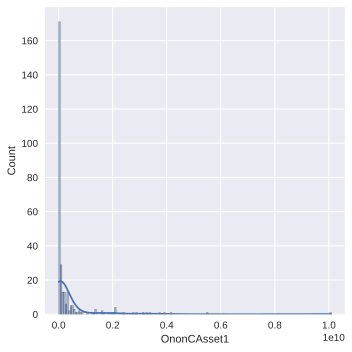

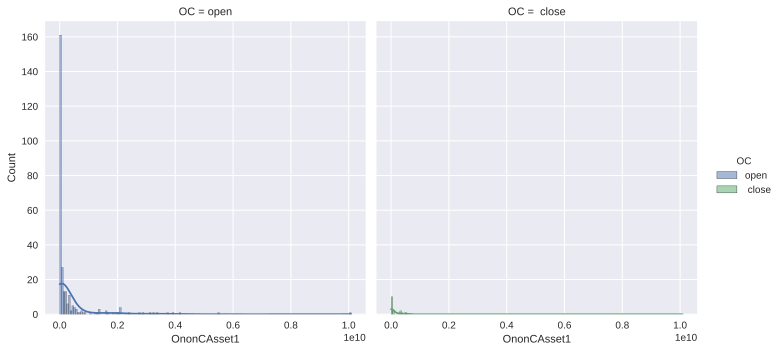

In [ ]:
#2017년 기타비유동자산

sns.displot(data=train, x='OnonCAsset1', kde=True)
sns.displot(data=train, x='OnonCAsset1', kde=True, hue='OC', col='OC')

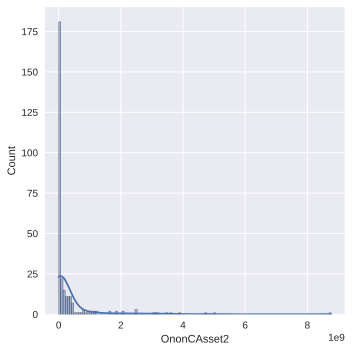

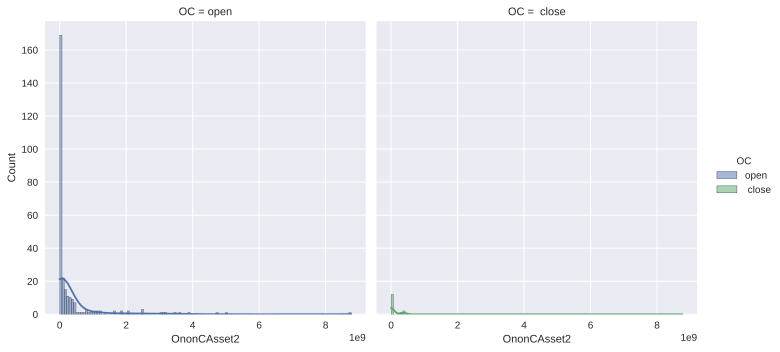

In [ ]:
#2016년 기타비유동자산

sns.displot(data=train, x='OnonCAsset2', kde=True)
sns.displot(data=train, x='OnonCAsset2', kde=True, hue='OC', col='OC')

In [ ]:
train[["OnonCAsset1","OnonCAsset2"]].corr()

,OnonCAsset1,OnonCAsset2
OnonCAsset1,1.000000,0.896619
OnonCAsset2,0.896619,1.000000


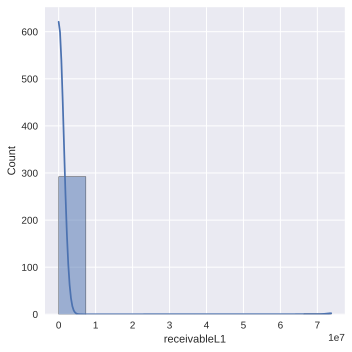

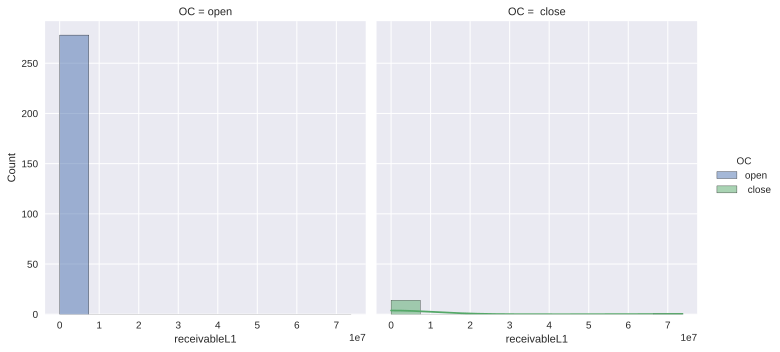

In [ ]:
#2017년 장기미수금

sns.displot(data=train, x='receivableL1', kde=True)
sns.displot(data=train, x='receivableL1', kde=True, hue='OC', col='OC')

In [ ]:
train["receivableL1"].tail(5)

296           0.0
297           0.0
298           0.0
299    73742310.0
300           0.0
Name: receivableL1, dtype: float64

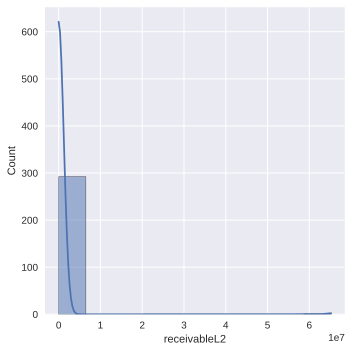

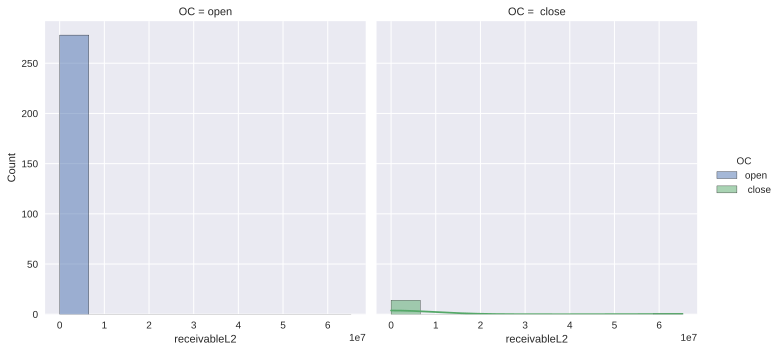

In [ ]:
#2016년 장기미수금

sns.displot(data=train, x='receivableL2', kde=True)
sns.displot(data=train, x='receivableL2', kde=True, hue='OC', col='OC')

In [ ]:
train["receivableL2"].tail(5)

296           0.0
297           0.0
298           0.0
299    65242310.0
300           0.0
Name: receivableL2, dtype: float64

In [ ]:
train[["receivableL1","receivableL2"]].corr()

,receivableL1,receivableL2
receivableL1,1.0,1.0
receivableL2,1.0,1.0


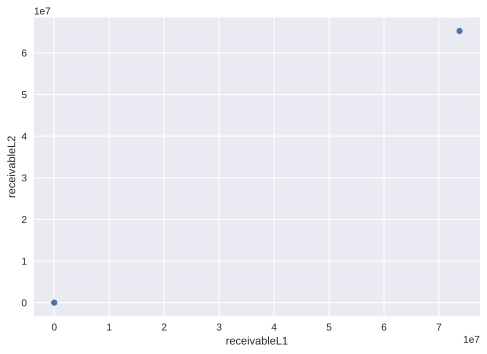

In [ ]:
sns.scatterplot(data=train, x='receivableL1', y='receivableL2')

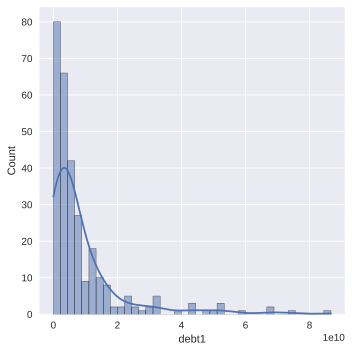

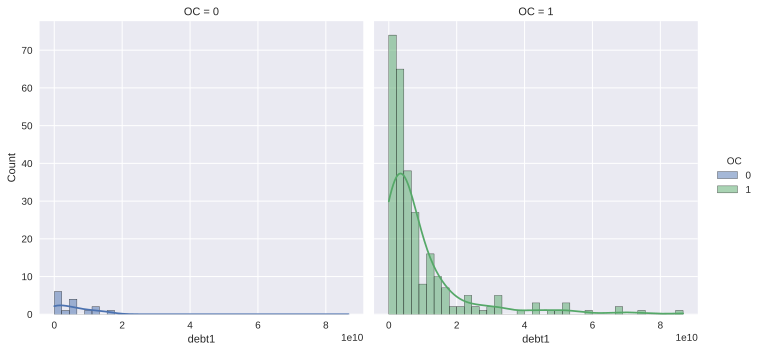

In [ ]:
#2017년 부채총계

sns.displot(data=train, x='debt1', kde=True)
sns.displot(data=train, x='debt1', kde=True, hue='OC', col='OC')

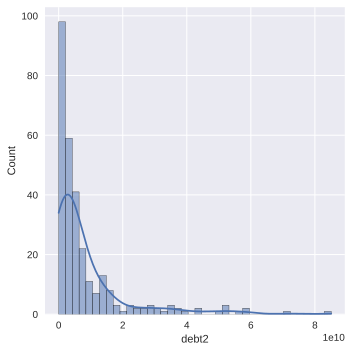

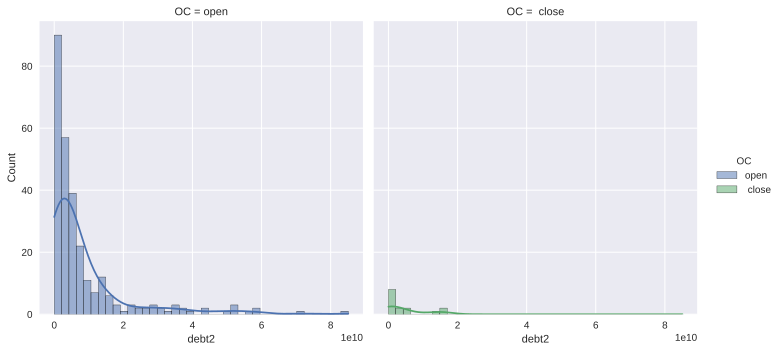

In [ ]:
#2016년 부채총계

sns.displot(data=train, x='debt2', kde=True)
sns.displot(data=train, x='debt2', kde=True, hue='OC', col='OC')

In [ ]:
train[["debt1","debt2"]].corr()

,debt1,debt2
debt1,1.000000,0.952324
debt2,0.952324,1.000000


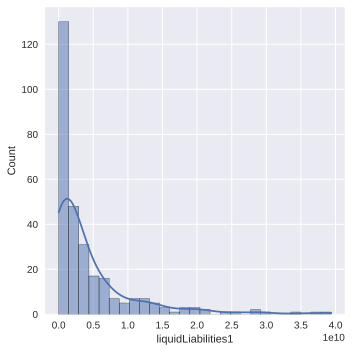

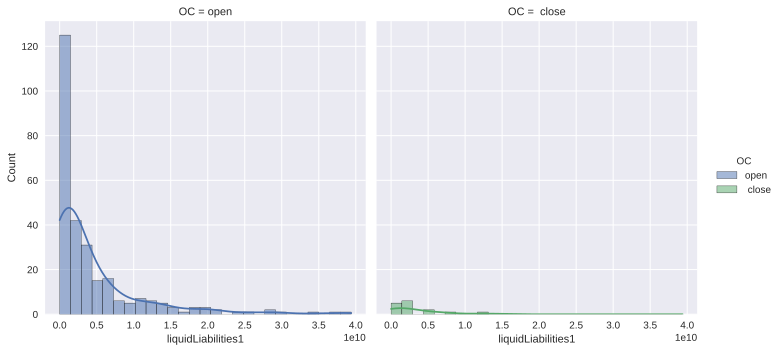

In [ ]:
#2017년 유동부채

sns.displot(data=train, x='liquidLiabilities1', kde=True)
sns.displot(data=train, x='liquidLiabilities1', kde=True, hue='OC', col='OC')

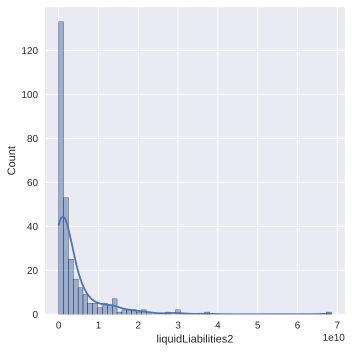

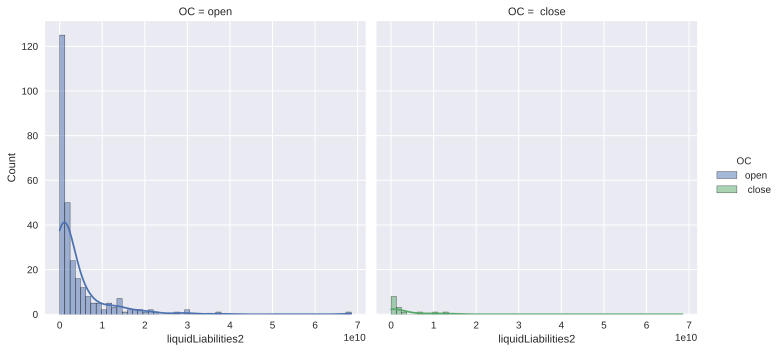

In [ ]:
#2016년 유동부채

sns.displot(data=train, x='liquidLiabilities2', kde=True)
sns.displot(data=train, x='liquidLiabilities2', kde=True, hue='OC', col='OC')

In [ ]:
train[["liquidLiabilities1","liquidLiabilities2"]].corr()

,liquidLiabilities1,liquidLiabilities2
liquidLiabilities1,1.000000,0.895694
liquidLiabilities2,0.895694,1.000000


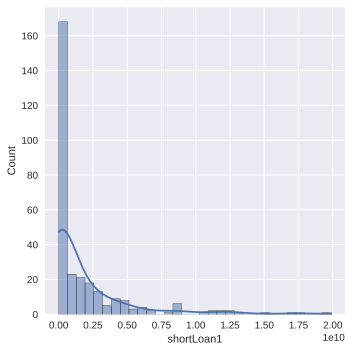

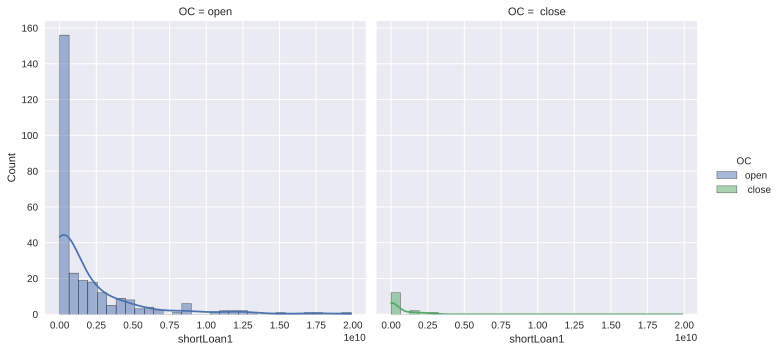

In [ ]:
#2017년 단기차입금
sns.displot(data=train, x='shortLoan1', kde=True)
sns.displot(data=train, x='shortLoan1', kde=True, hue='OC', col='OC')


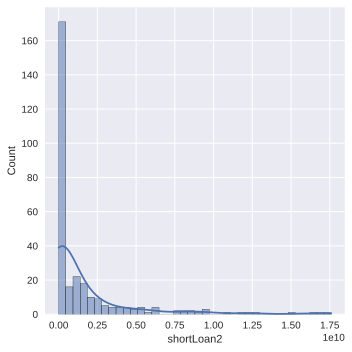

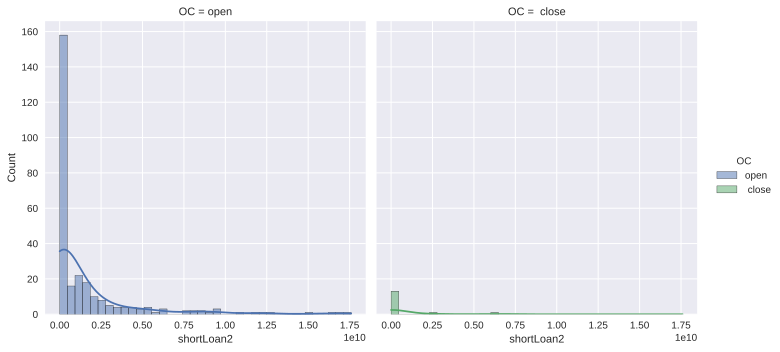

In [ ]:
#2016년 단기차입금
sns.displot(data=train, x='shortLoan2', kde=True)
sns.displot(data=train, x='shortLoan2', kde=True, hue='OC', col='OC')


In [ ]:
train[["shortLoan1","shortLoan2"]].corr()

,shortLoan1,shortLoan2
shortLoan1,1.000000,0.831054
shortLoan2,0.831054,1.000000


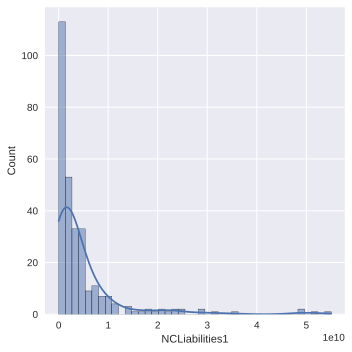

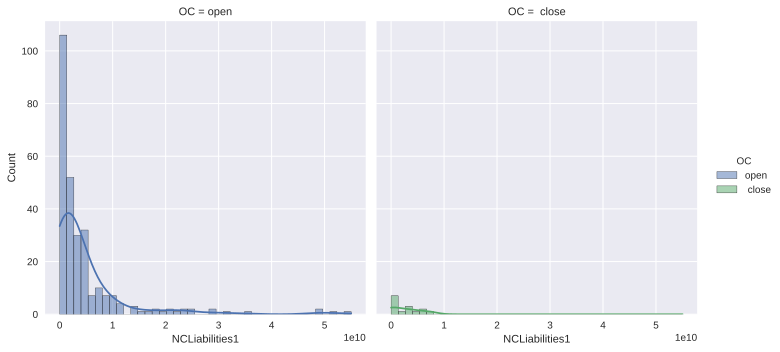

In [ ]:
#2017년 비유동부채
sns.displot(data=train, x='NCLiabilities1', kde=True)
sns.displot(data=train, x='NCLiabilities1', kde=True, hue='OC', col='OC')

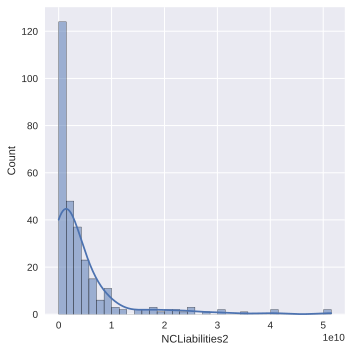

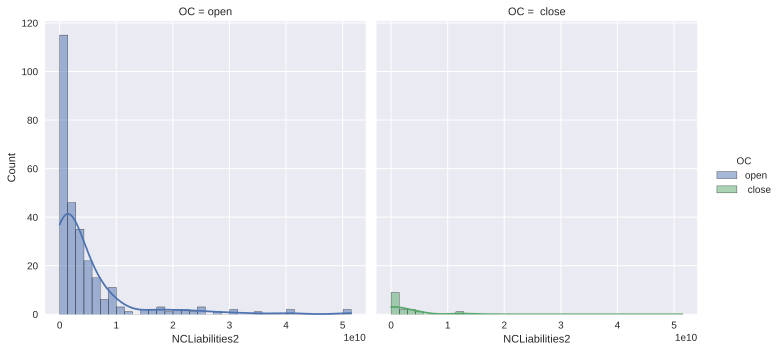

In [ ]:
#2016년 비유동부채
sns.displot(data=train, x='NCLiabilities2', kde=True)
sns.displot(data=train, x='NCLiabilities2', kde=True, hue='OC', col='OC')

In [ ]:
train[["NCLiabilities1","NCLiabilities2"]].corr()

,NCLiabilities1,NCLiabilities2
NCLiabilities1,1.000000,0.879774
NCLiabilities2,0.879774,1.000000


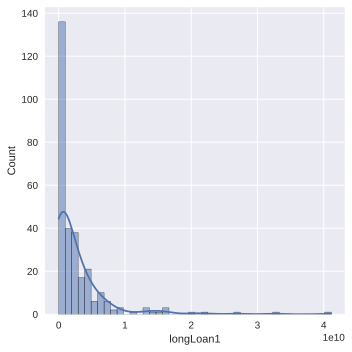

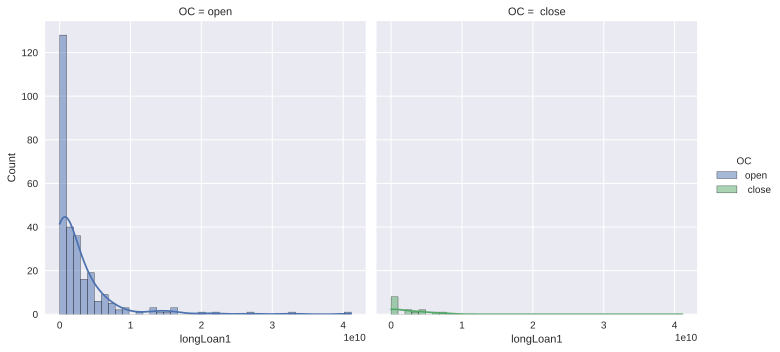

In [ ]:
#2017년 장기차입금
sns.displot(data=train, x='longLoan1', kde=True)
sns.displot(data=train, x='longLoan1', kde=True, hue='OC', col='OC')

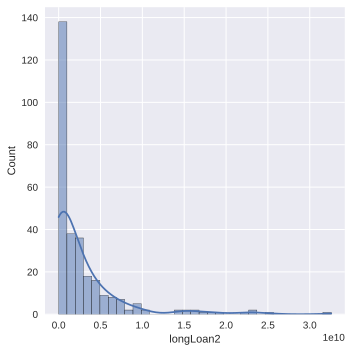

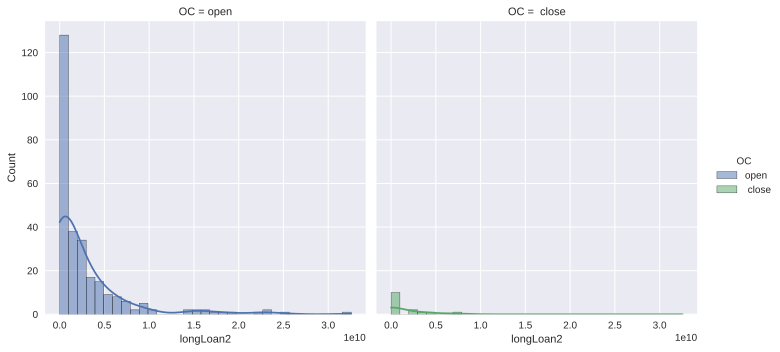

In [ ]:
#2016년 장기차입금
sns.displot(data=train, x='longLoan2', kde=True)
sns.displot(data=train, x='longLoan2', kde=True, hue='OC', col='OC')

In [ ]:
train[["longLoan1","longLoan2"]].corr()

,longLoan1,longLoan2
longLoan1,1.000000,0.790187
longLoan2,0.790187,1.000000


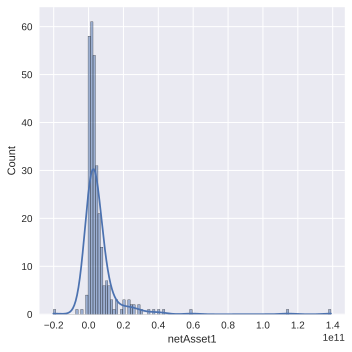

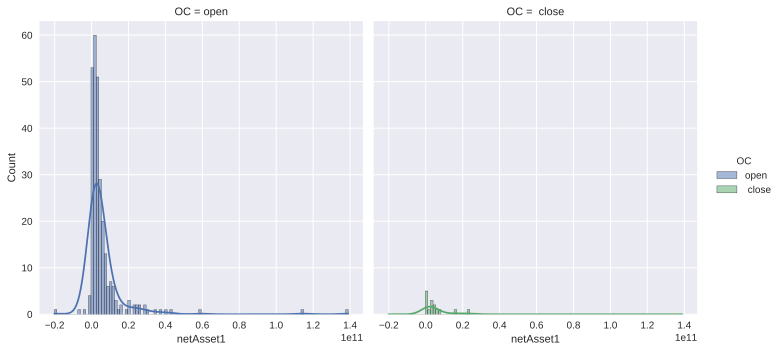

In [ ]:
#2017년 순자산총계
sns.displot(data=train, x='netAsset1', kde=True)
sns.displot(data=train, x='netAsset1', kde=True, hue='OC', col='OC')

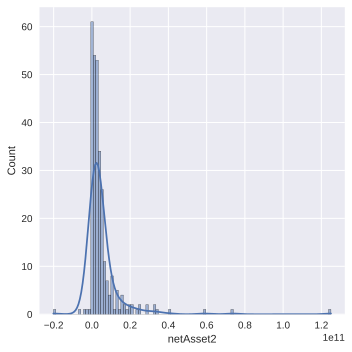

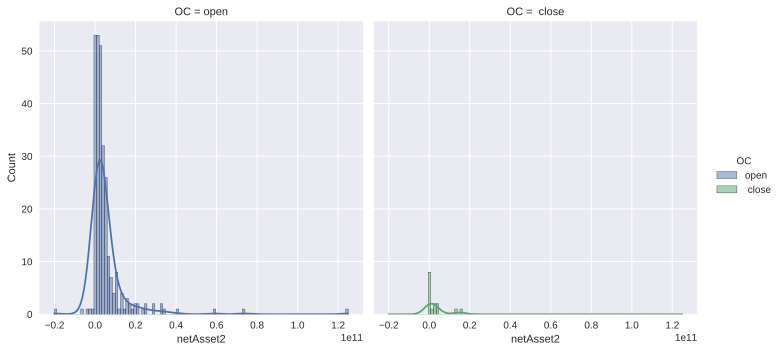

In [ ]:
#2016년 순자산총계
sns.displot(data=train, x='netAsset2', kde=True)
sns.displot(data=train, x='netAsset2', kde=True, hue='OC', col='OC')

In [ ]:
train[["netAsset1","netAsset2"]].corr()

,netAsset1,netAsset2
netAsset1,1.000000,0.941897
netAsset2,0.941897,1.000000


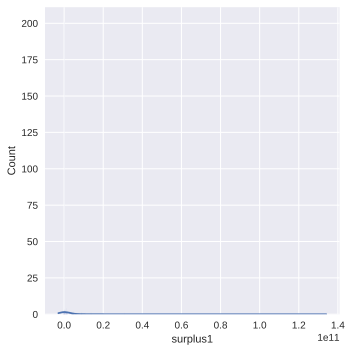

In [ ]:
#2017년 이익잉여금
sns.displot(data=train, x='surplus1', kde=True)
sns.displot(data=train, x='surplus1', kde=True, hue='OC', col='OC')
 

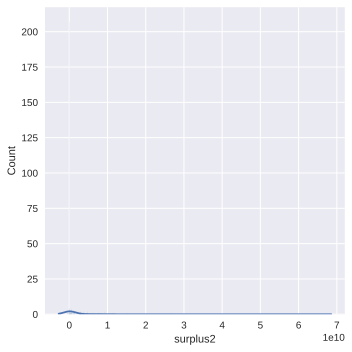

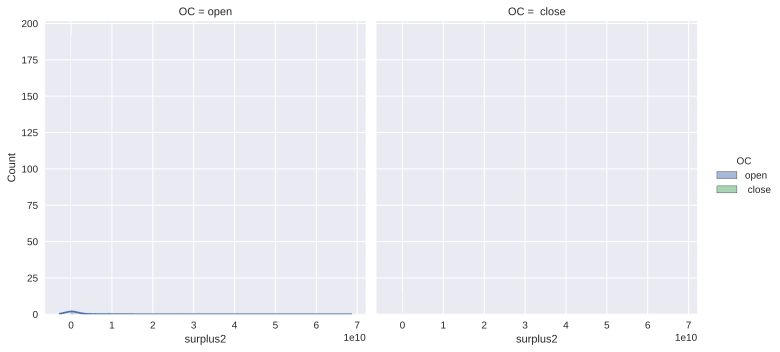

In [ ]:
#2016년 이익잉여금
sns.displot(data=train, x='surplus2', kde=True)
sns.displot(data=train, x='surplus2', kde=True, hue='OC', col='OC')


In [ ]:
train[["surplus1","surplus2"]].corr()

,surplus1,surplus2
surplus1,1.000000,0.952722
surplus2,0.952722,1.000000


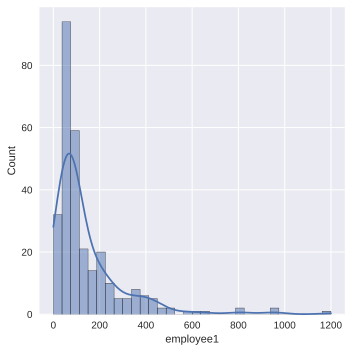

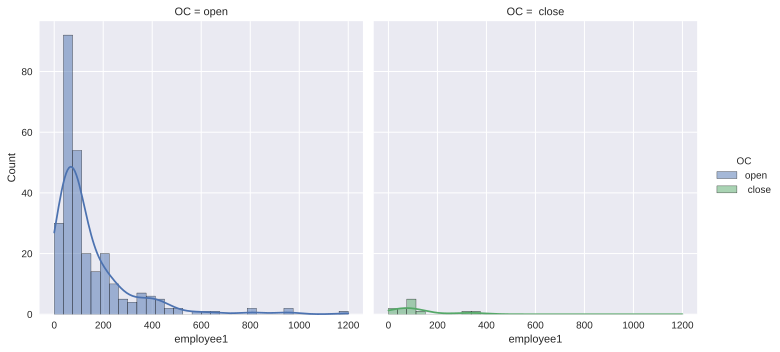

In [ ]:
#2017년 고용한 총 직원의 수
sns.displot(data=train, x='employee1', kde=True)
sns.displot(data=train, x='employee1', kde=True, hue='OC', col='OC')

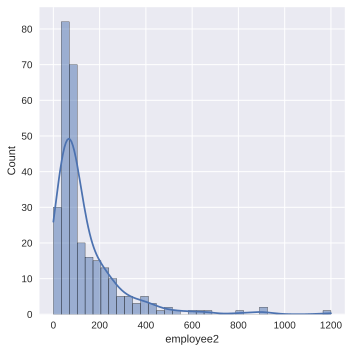

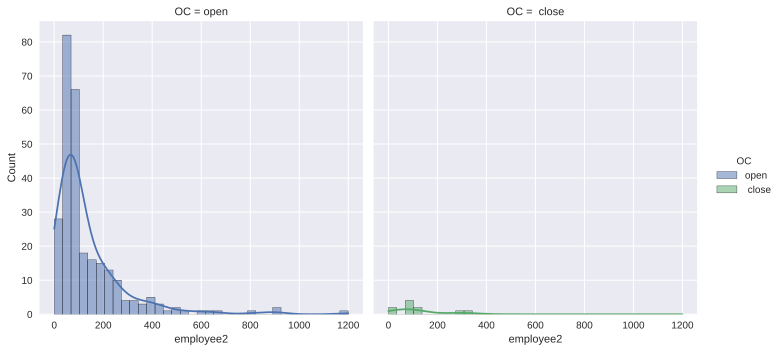

In [ ]:
#2016년 고용한 총 직원의 수
sns.displot(data=train, x='employee2', kde=True)
sns.displot(data=train, x='employee2', kde=True, hue='OC', col='OC')

In [ ]:
train[["employee1","employee2"]].corr()

,employee1,employee2
employee1,1.000000,0.973681
employee2,0.973681,1.000000


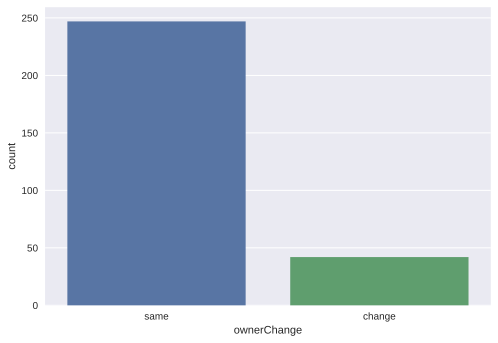

In [ ]:
#대표자의 변동
sns.countplot(data=train , x='ownerChange')

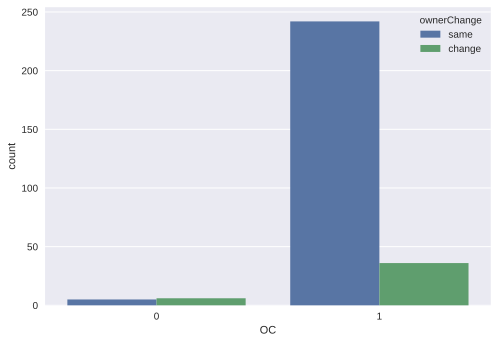

In [ ]:
sns.countplot(data=train, x='OC',hue="ownerChange")

###데이터전처리

In [ ]:
#결측치처리
#인코딩(범주형 -> 수치형)
#스케일링?
#다중공선성 해결

###모델링

In [ ]:
#교차검증 or  홀드아웃?

In [ ]:
#모델
#randomforest
#XGB
#LightGBM
#DecisionTree
#Logistic
#

###평가

In [ ]:
#accuracy_score